In [183]:
%load_ext autoreload
%autoreload 2
import os
import pickle as pkl
from typing import Dict, Any
from collections import Counter

import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500) 
pd.set_option('display.max_columns', 50) 
import sklearn as sk
from tqdm import tqdm
from sklearn.metrics import (
    accuracy_score, roc_auc_score, roc_curve, precision_score, recall_score, 
    average_precision_score, precision_recall_curve, plot_roc_curve, plot_precision_recall_curve, make_scorer
)
from sklearn.model_selection import KFold, cross_validate, train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.datasets import fetch_openml
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 250
import dvu  # for visualization

import imodels

# change working directory to project root
if os.getcwd().split('/')[-1] == 'notebooks':
    os.chdir('../..')

from experiments.models.stablelinear import StableLinearClassifier
from experiments.models.stableskope import StableSkopeClassifier
from experiments.notebooks import viz
from experiments.util import (
    get_comparison_result, get_openml_dataset, get_clean_dataset, 
    get_best_model_under_complexity, MODEL_COMPARISON_PATH, get_best_accuracy
)

np.random.seed(0)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [187]:
# # from experiments.config.ensemble_config import get_weak_learner_inst_list

# wl_list = get_weak_learner_inst_list([35])[0]
# del wl_list[3]
# wl_list

# # np.random.seed(0)
x, y, feat_names = get_clean_dataset('experiments/data/compas-analysis/compas_two_year_clean.csv')
xtrain, xtest, ytrain, ytest = sk.model_selection.train_test_split(x, y, test_size=0.2, random_state=0)

# m1 = StableLinearClassifier(
#     weak_learners=wl_list,
#     max_complexity = 6,
#     alpha = 1,
#     min_mult = 1,
#     penalty = 'l1',
#     max_rules = None,
#     include_linear = False)
# # m2 = imodels.FPLassoClassifier(alpha=630.957344480193, disc_strategy='simple', max_rules=None, maxcardinality=1, include_linear = False)
# m2 = imodels.RuleFitClassifier(alpha=30, include_linear=False, max_rules=None, n_estimators=3, random_state=0)
# m4 = imodels.BoostedRulesClassifier(n_estimators=5)
# m5 = imodels.SkopeRulesClassifier(max_depth=1, n_estimators=100, precision_min=0.3)

# ms = [m1, m2, m4, m5]
# for model in ms:
#     model.fit(xtrain, ytrain, feature_names=feat_names)

# [m.complexity_ for m in ms]
# [get_best_accuracy(m) for m in ms]

In [470]:
# m1 = imodels.RuleFitClassifier(alpha=30, n_estimators=2, max_rules=None, random_state=0)
# m2 = imodels.SkopeRulesClassifier(n_estimators=1, random_state=0)
# m1.fit(xtrain, ytrain)
# m2.fit(xtrain, ytrain)

In [471]:
# m1.rules_

In [472]:
# m2.rules_

In [473]:
# from experiments.models.util import extract_ensemble, split

In [474]:
# extract_ensemble([m1, m2], xtrain, ytrain, min_multiplicity=1)

In [475]:
# for i, model in enumerate(ms):
#     plt.subplot(2, 2, i + 1)
#     yscores = model.predict_proba(xtest)[:, 1]
#     plt.title(repr(model)[:10] + ' - AP ' + str(average_precision_score(ytest, yscores))[:5])
# #     plt.title(repr(model)[:10] + ' - AUC ' + str(roc_auc_score(ytest, yscores))[:5])
#     y, x, _ = precision_recall_curve(ytest, yscores)
# #     x, y, _ = roc_curve(ytest, model.predict_proba(xtest)[:, 1])
#     plt.step(x, y)
# plt.tight_layout()

In [476]:
# rule_df = get_comparison_result(MODEL_COMPARISON_PATH, 'stbl_l1_mm1', 'test')['rule_df']
# comp_result = get_comparison_result(MODEL_COMPARISON_PATH, 'stbl_l1_mm1', 'test')
# from experiments.compare_models import compute_meta_auc

In [477]:
# x = np.array([1, 1, 1, 2, 3, 3, 3])
# y = np.array([0, 5, 0, 2, 6, 0, 0])

# y_for_unique_x = []

# unique_arr, inds, counts = np.unique(x, return_index=True, return_counts=True)
# for i, ind in enumerate(inds):
#     y_for_unique_x.append(y[ind:ind+counts[i]].max())
# y_for_unique_x

In [478]:
# for model in ['stbl_l1', 'stbl_l2']:
#     for dataset in ['readmission', 'juvenile', 'recidivism', 'credit']:
#         result = pkl.load(open(f'experiments/comparison_data/reg_data/{dataset}/val/{model}_comparisons.pkl', 'rb'))
# #         result['df']['mean_complexity'] = result['df'][f'{dataset}_complexity']
#         result['meta_auc_df'] = compute_meta_auc(result['df'])
#         pkl.dump(result, open(f'experiments/comparison_data/reg_data/{dataset}/val/{model}_comparisons.pkl', 'wb'))
# result['meta_auc_df']

In [479]:
# get_comparison_result(MODEL_COMPARISON_PATH, 'fplasso', 'credit')['meta_auc_df']

In [480]:
# s.run('python experiments/compare_models.py --model stbl_l2 --dataset recidivism --ignore_cache --parallel_id 0 2')

In [481]:
# from slurmpy import Slurm
# partition = 'high'
# s = Slurm("compare_models", {"partition": partition})

# for dataset in ['readmission', 'credit', 'juvenile']:
#     for i in range(36):
#         s.run(f'python experiments/compare_models.py --model stbl_l1 --dataset {dataset} --ignore_cache --parallel_id {i*6} {(i+1)*6-1}')

# validation plots - readmission

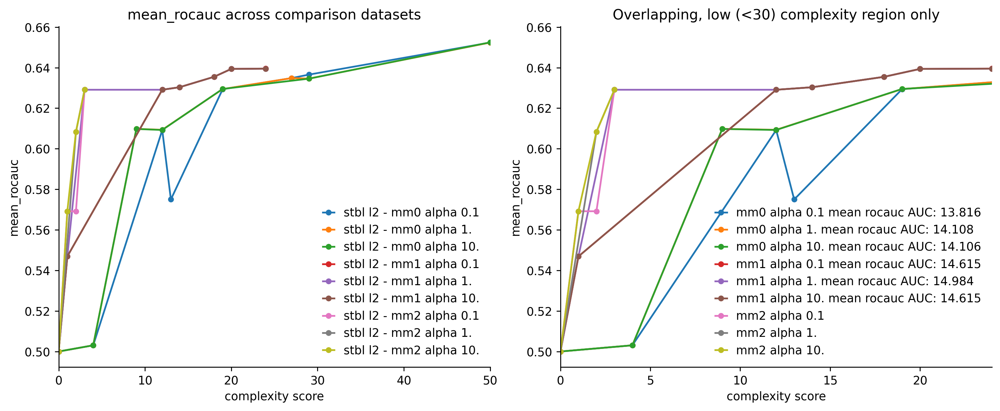

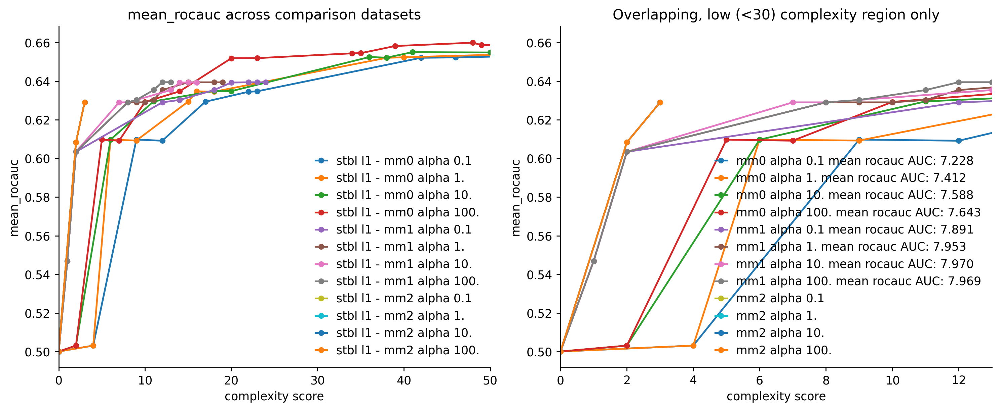

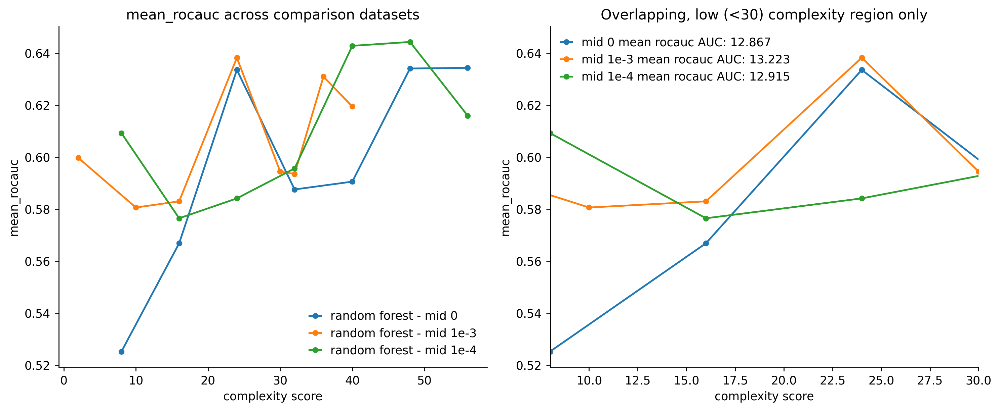

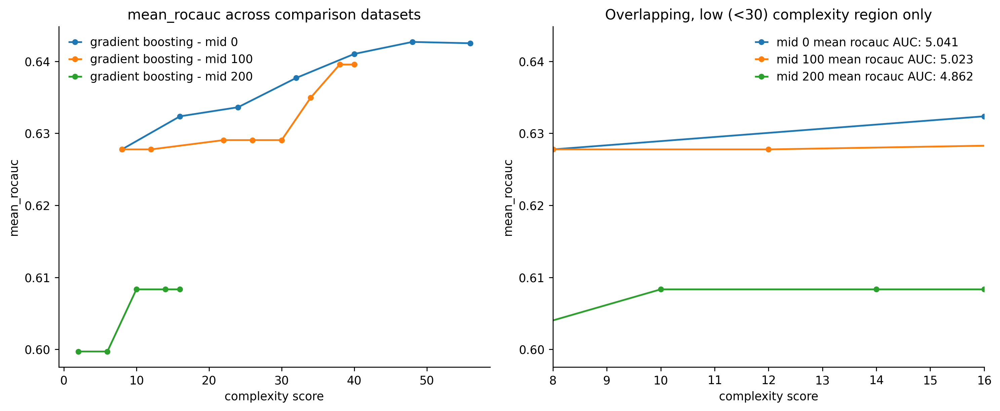

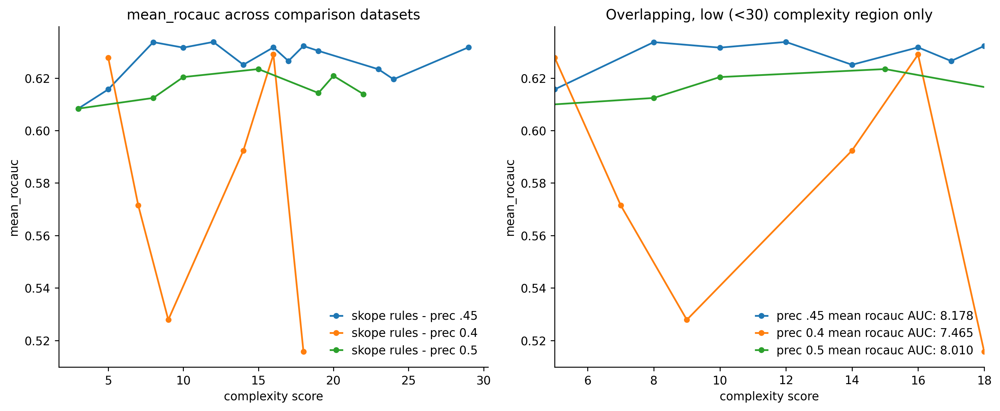

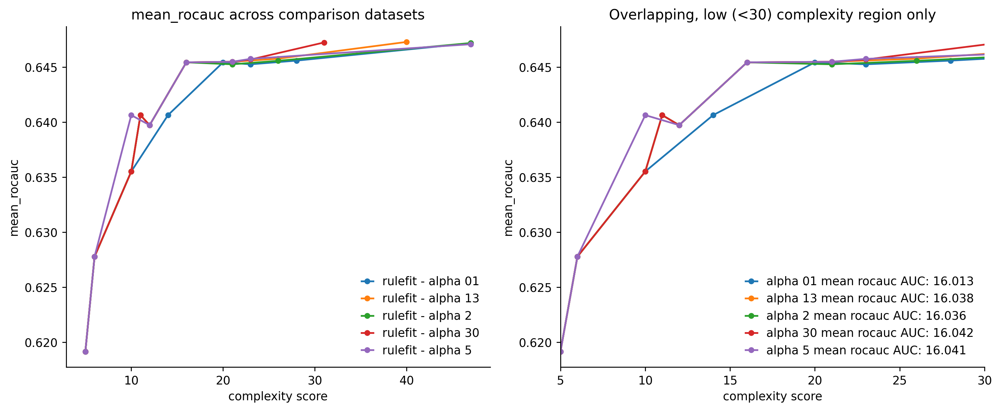

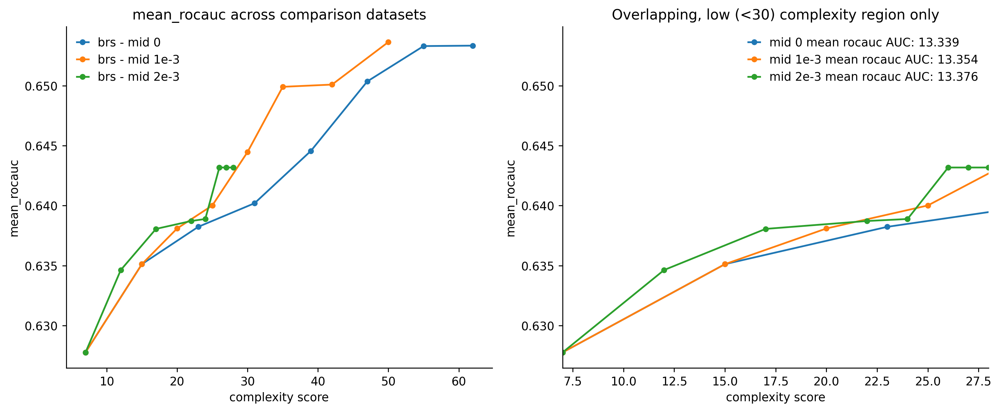

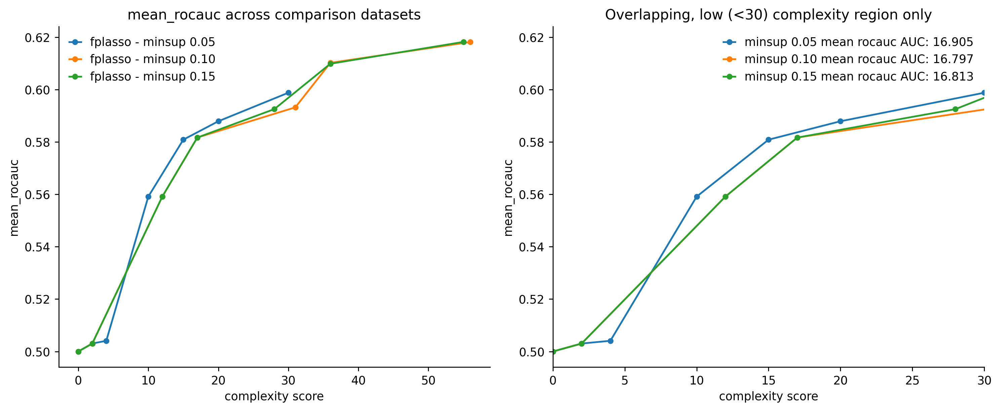

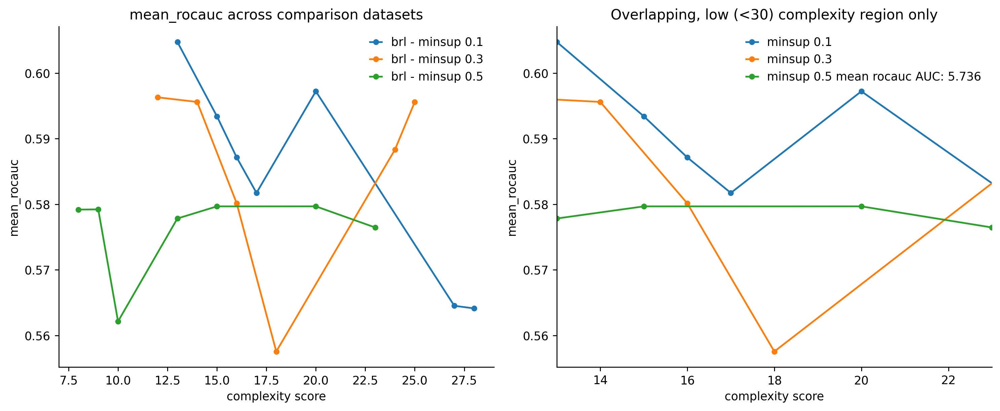

In [466]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'brs', 'fplasso', 'brl']#'stbl_l2', 'stbl_l1', 'stbl_unlim_l1', 'stbl_unlim_fps_l1']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, 'readmission') for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_rocauc')
    plt.show()

# validation plots - credit default

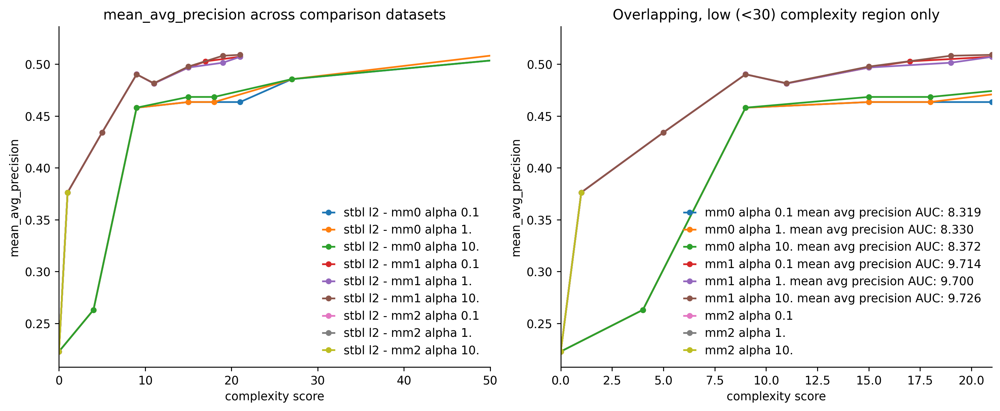

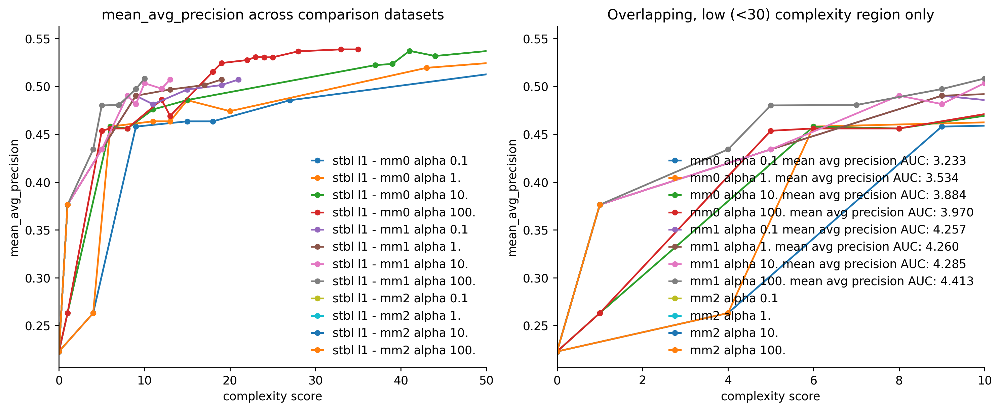

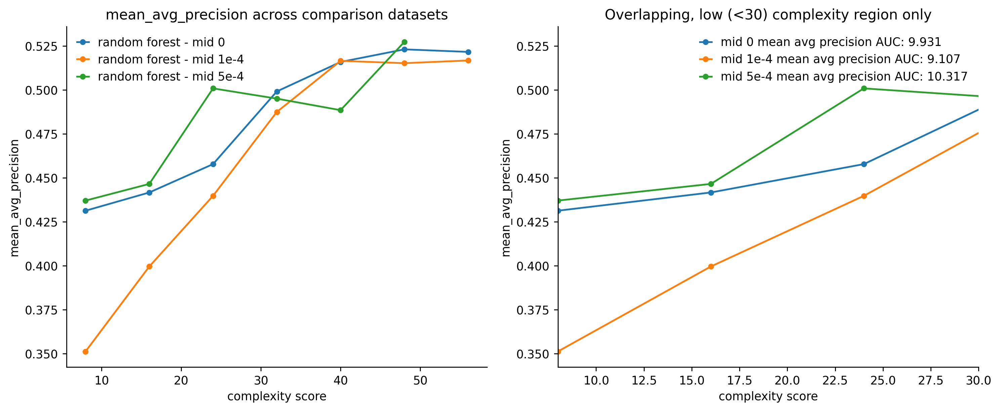

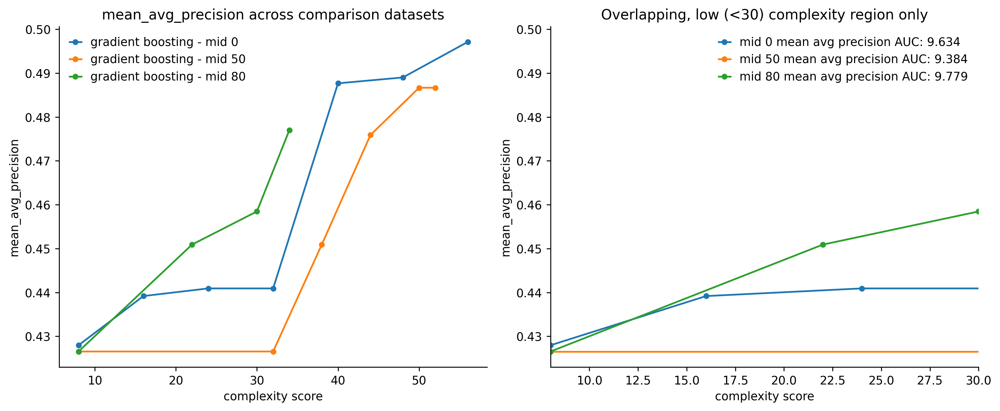

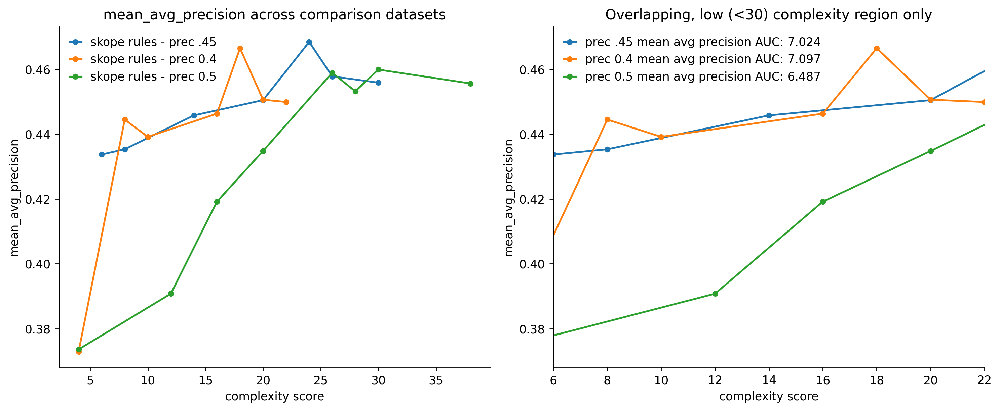

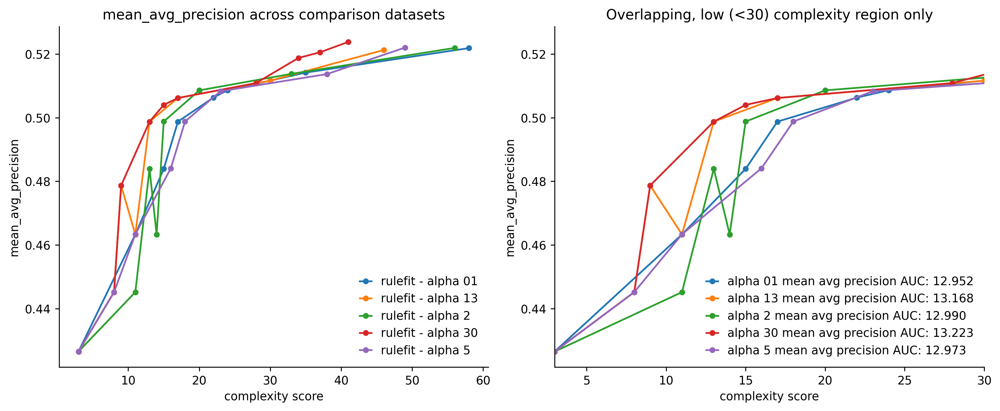

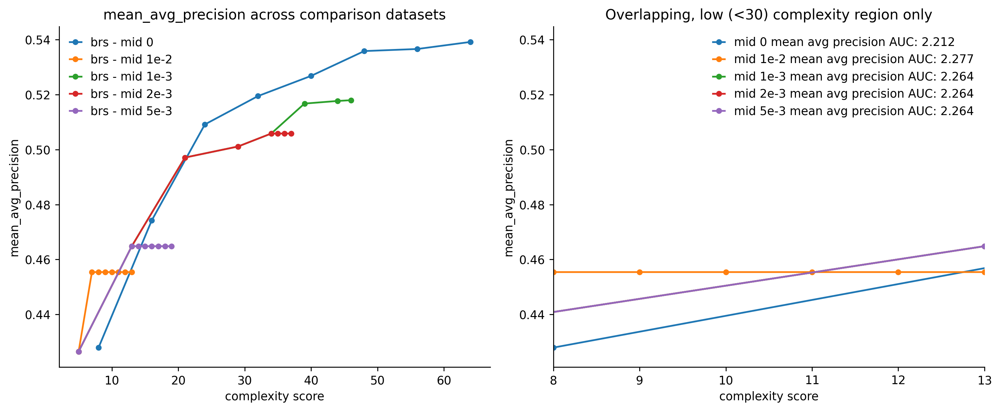

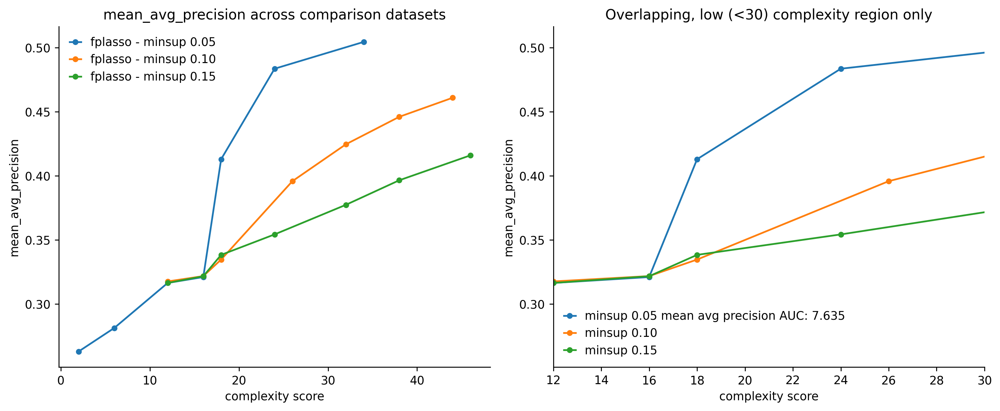

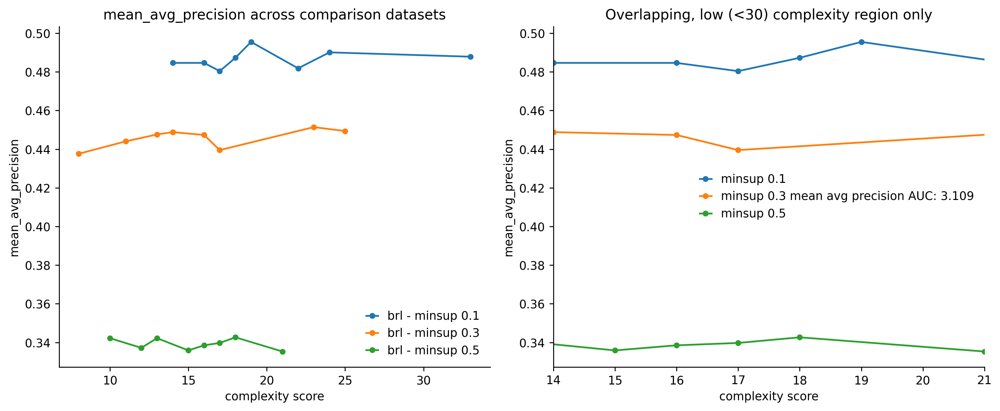

In [482]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'brs', 'fplasso', 'brl']#'stbl_l2', 'stbl_l1', 'stbl_unlim_l1', 'stbl_unlim_fps_l1', 'fplasso', 'brl']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, 'credit') for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_avg_precision')
    plt.show()

# validation plots - recidivism

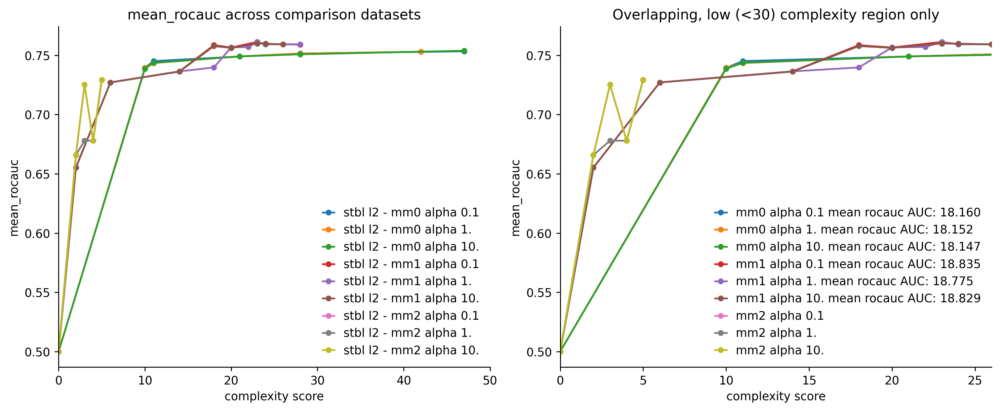

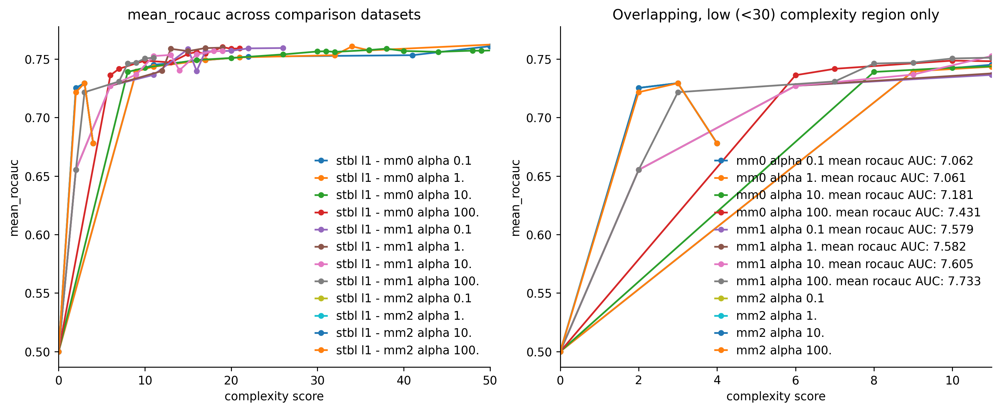

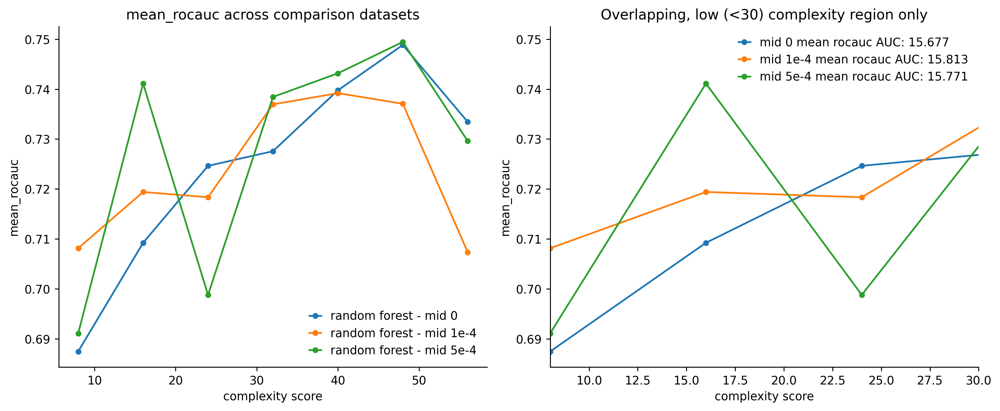

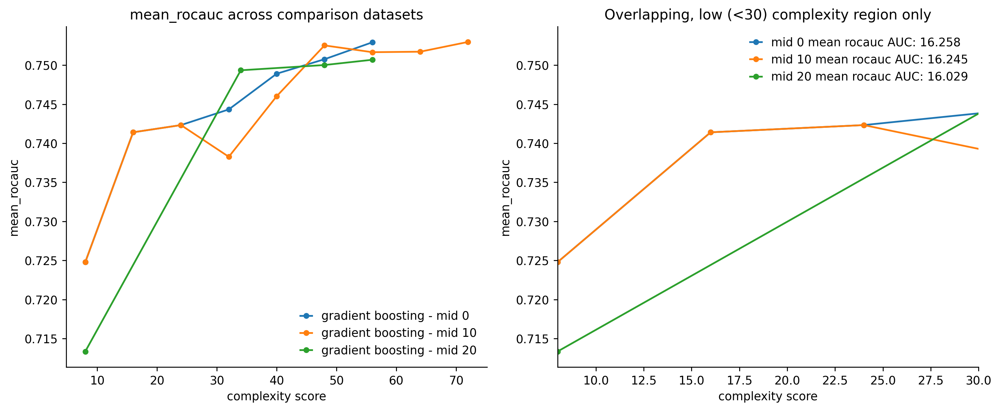

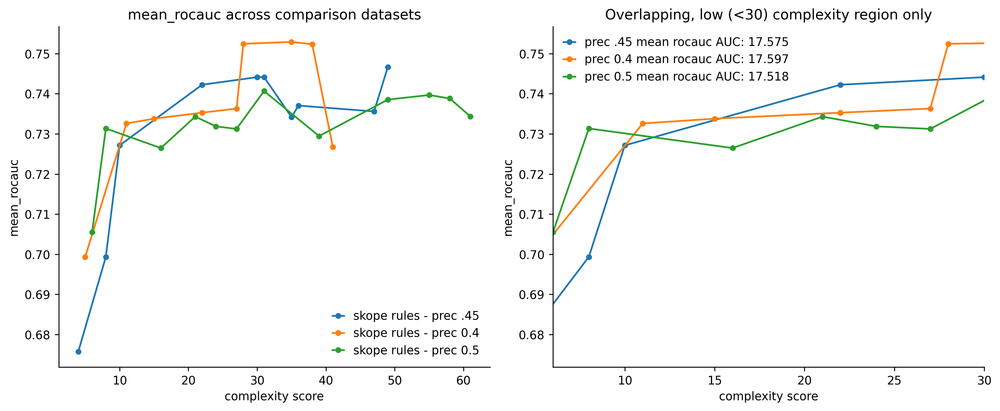

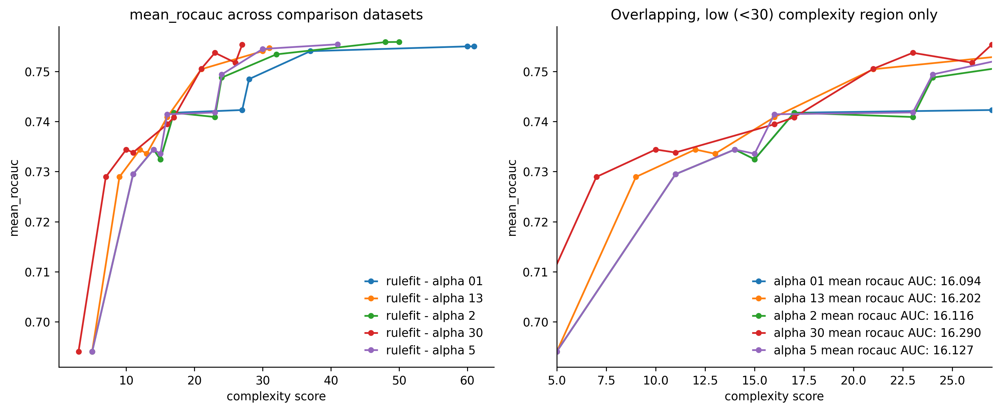

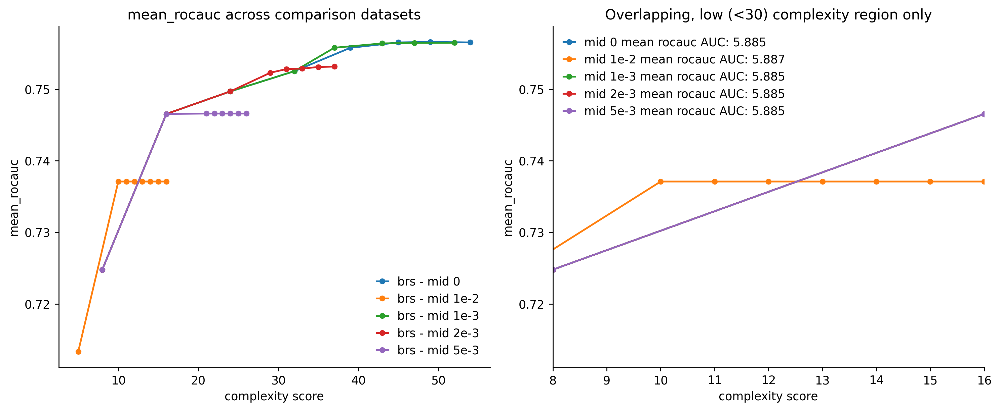

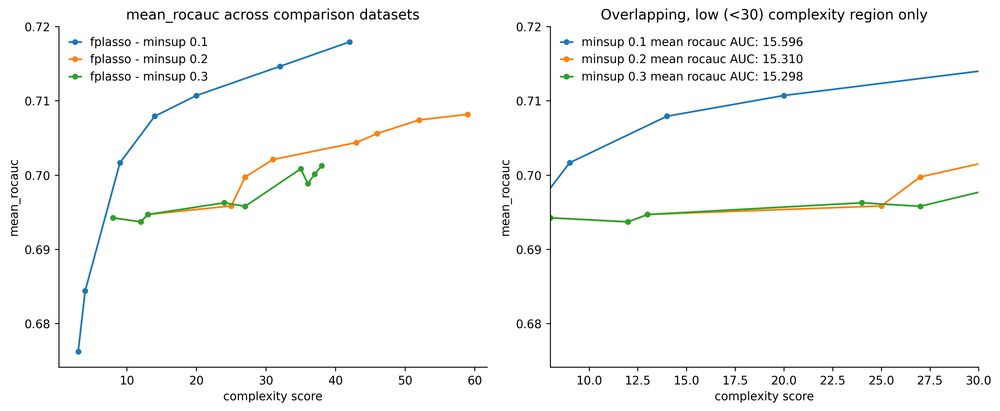

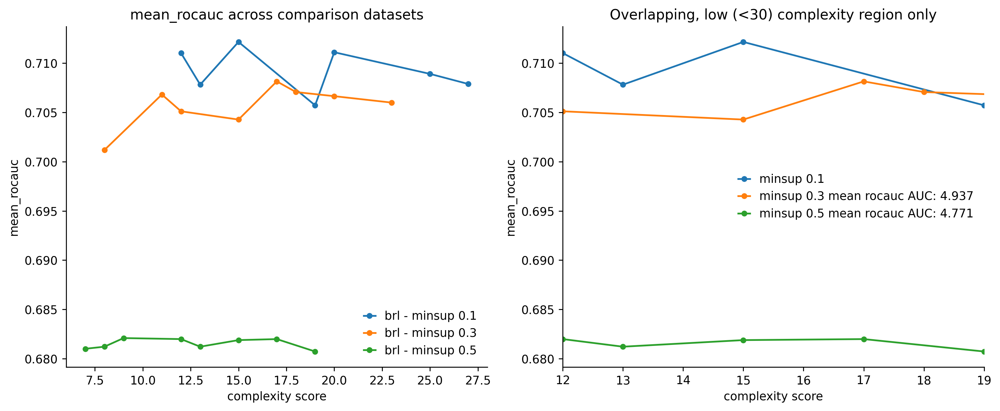

In [483]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'brs', 'fplasso', 'brl']#'stbl_l2', 'stbl_l1', 'stbl_unlim_l1', 'stbl_unlim_fps_l1']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, 'recidivism') for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_rocauc')
    plt.show()

# validation plots - juvenile

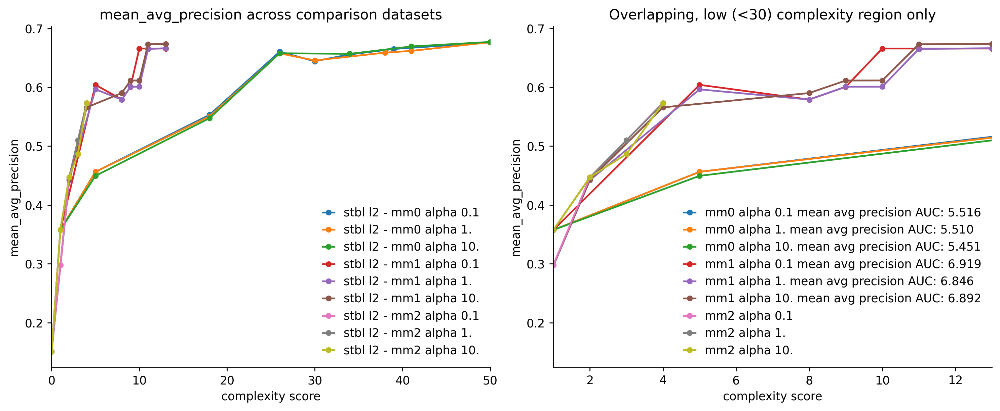

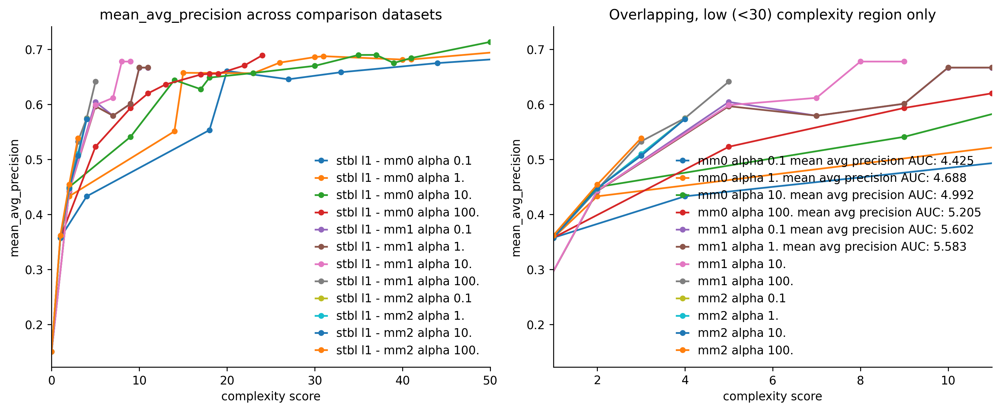

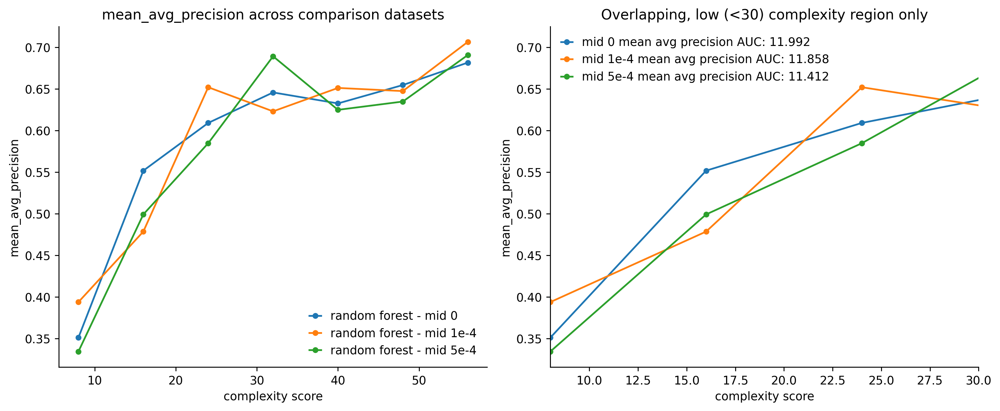

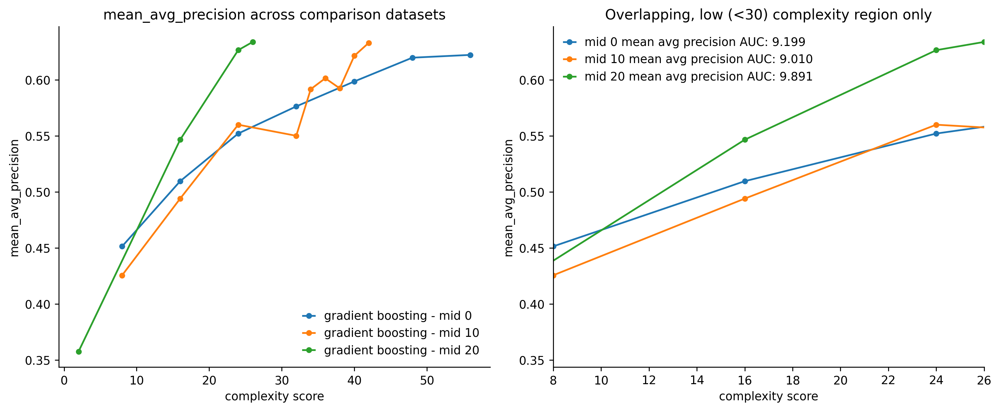

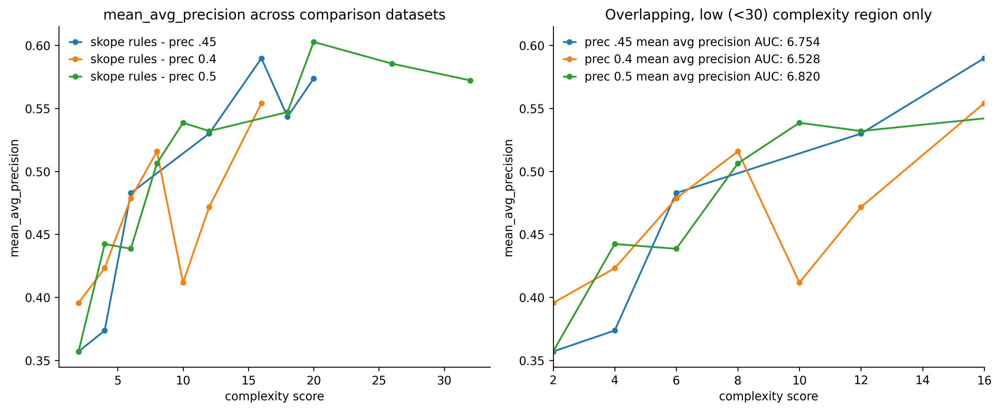

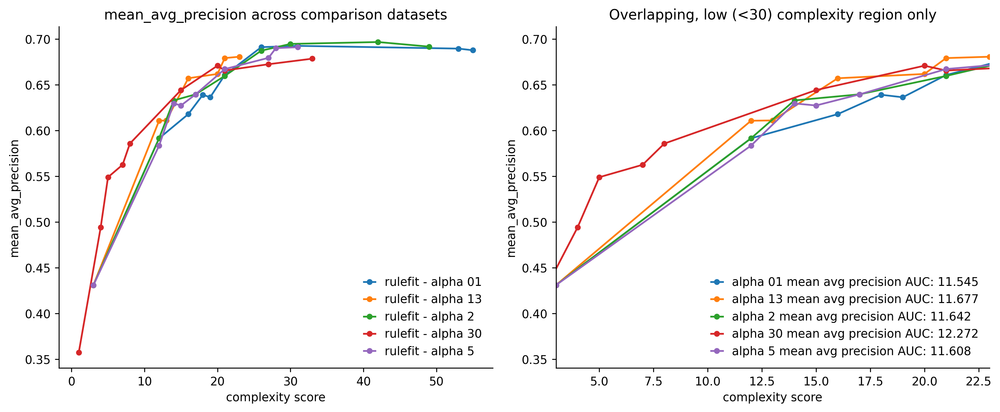

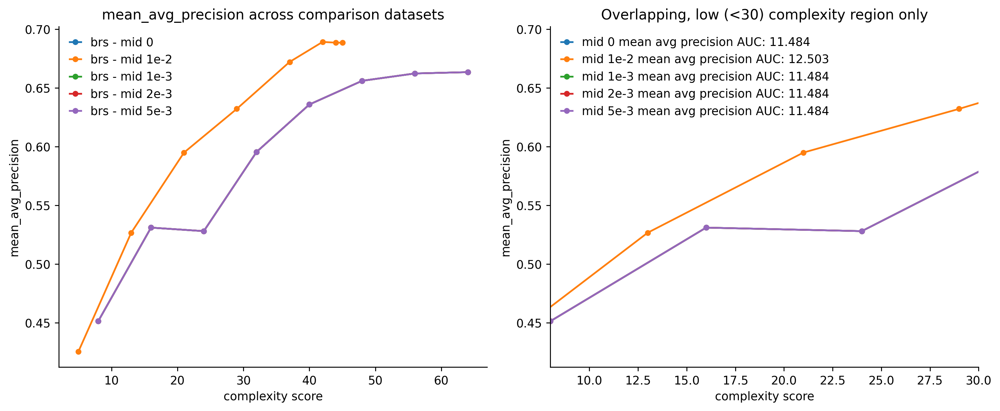

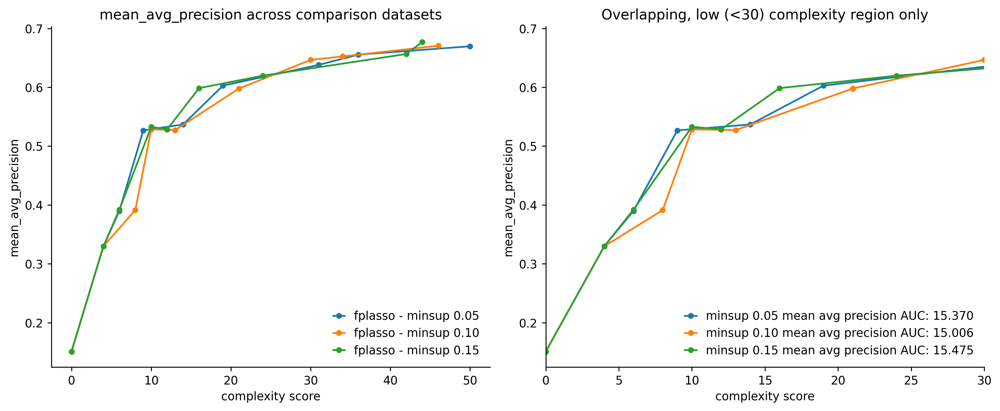

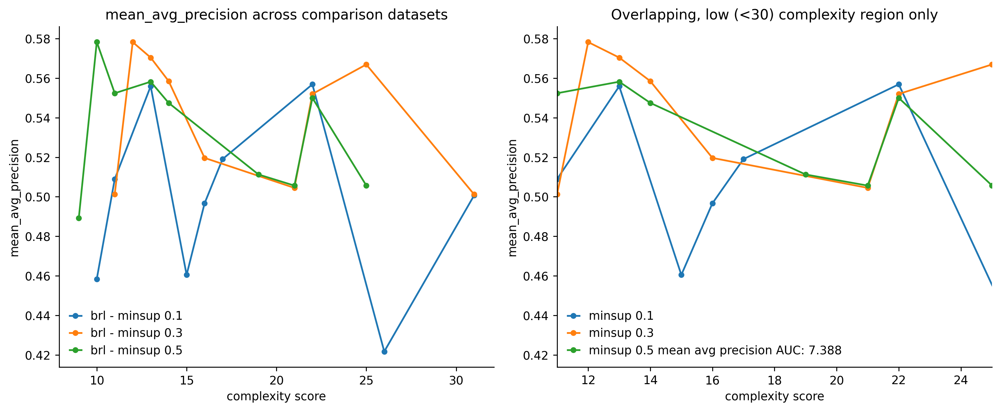

In [469]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'brs', 'fplasso', 'brl']#'stbl_l2', 'stbl_l1', 'stbl_unlim_l1', 'stbl_unlim_fps_l1']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, 'juvenile') for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_avg_precision')
    plt.show()